In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'NanumGothicCoding'
plt.rcParams['font.size'] = 15
import seaborn as sns
from plotnine import *
import missingno as msno

영업 중인 전국 상가업소 동향  
공공데이터포털(https://www.data.go.kr/)에서 소상공인시장진흥공단_상가(상권)정보 검색  
<img src="./datagokr2.png" width="1000" align="left">

소상공인시장진흥공단_상가(상권)정보 중에서 서울과 부산 데이터만 읽어서 하나의 데이터프레임으로 만들어서 csv 파일로 저장한다.

In [2]:
# shop_2022_seoul = pd.read_csv('./data/shop_2022_seoul.csv', encoding='cp949')
# print(shop_2022_seoul.shape)
# shop_2022_seoul.head()

In [3]:
# shop_2022_busan = pd.read_csv('./data/shop_2022_busan.csv')
# print(shop_2022_busan.shape)
# shop_2022_busan.head()

In [4]:
# shop_2022 = pd.concat([shop_2022_seoul, shop_2022_busan], axis=0, ignore_index=True)
# shop_2022

In [5]:
# 서울과 부산 데이터만 읽어서 하나의 데이터프레임만든 데이터를 csv 파일로 저장한다.
# csv 파일로 저장할 때 인덱스를 제외하고 저장하려면 index=None 옵션을 사용한다.
# shop_2022.to_csv('./data/shop_2022.csv', index=None)

In [6]:
# 파이썬은 java 처럼 {} 블록을 벗어나면 사용한 변수를 삭제하지 못하므로 계속 메모리를 차지하는 문제가 발생되므로 del 명령을
# 실행해서 사용하지 않는 변수는 메모리에서 삭제한다.
# del shop_2022_seoul, shop_2022_busan

서울과 부산 데이터만 읽어서 하나의 데이터프레임으로 만들어서 저장한 csv 파일을 읽어들인다.

In [7]:
shop_2022 = pd.read_csv('./data/shop_2022.csv')
shop_2022

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,23324279,제중건강원,NaN,D,소매,D10,건강/미용식품,D10A07,건강원,G47216,...,1156010600100410002034626,NaN,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",150030,7250,NaN,1,NaN,126.907168,37.520613
1,24525909,민속악기사,NaN,D,소매,D04,취미/오락관련소매,D04A09,악기판매,G47593,...,1120012200101420011000227,NaN,"서울특별시 성동구 용답5길 2, (용답동)",133849,4803,NaN,NaN,NaN,127.049018,37.566857
2,24715368,태평양진주,NaN,D,소매,D26,시계/귀금속소매,D26A01,시계/귀금속,G47830,...,1111015200100440000000001,금사랑투빌딩,"서울특별시 종로구 서순라길 17-10, (봉익동)",110390,3138,NaN,NaN,NaN,126.993530,37.571848
3,15554136,김선희꼼꼼국어교습소,NaN,R,학문/교육,R01,학원-보습교습입시,R01A01,학원-입시,P85501,...,1171011100101970003017195,NaN,"서울특별시 송파구 위례성대로12길 31, (방이동)",138834,5640,NaN,2,NaN,127.121520,37.510967
4,17174175,비지트,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,1165010100108540018009586,상랑의빌딩,"서울특별시 서초구 동광로18길 82, (방배동)",137837,6572,NaN,1,NaN,126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519215,18759679,꾸미다뷰티,NaN,F,생활서비스,F01,이/미용/건강,F01A02,발/네일케어,S96119,...,2626010600100400013001989,NaN,"부산광역시 동래구 수안로8번길 35, (수안동)",607823,47887,E,1,NaN,129.089537,35.195231
519216,18759675,본가,꽃게아구,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,2623011000100560002048159,한신센타뷰,"부산광역시 부산진구 가야대로 597, (가야동, 한신센타뷰)",614800,47272,NaN,2,NaN,129.036980,35.155247
519217,18764252,블루워시,하단점,F,생활서비스,F02,세탁/가사서비스,F02A01,세탁소/빨래방,S96912,...,2638010300108870007035678,헤를리치,"부산광역시 사하구 하신번영로 302, (하단동, 헤를리치)",604853,49306,NaN,NaN,NaN,128.959048,35.108007
519218,18743127,몰운대,NaN,D,소매,D03,종합소매점,D03A05,수입품판매점,G47190,...,2638010600116240000000001,다대동롯데캐슬몰운대아파트,"부산광역시 사하구 다대낙조2길 100, (다대동)",604783,49497,104,NaN,NaN,128.965427,35.056377


In [8]:
shop_2022.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

분석 작업에 불필요한 컬럼을 삭제한다.

In [9]:
# drop() 함수로 불필요한 컬럼을 삭제한다. => 원본 데이터가 손상된다.
# drop() 함수는 axis=0이 기본값이므로 axis를 생략하면 행 방향 데이터를 제거하려 하기 때문에 에러가 발생되므로 axis=1 옵션을
# 지정해서 컬럼을 삭제하도록 지정한다.
# 1개의 컬럼을 삭제하려면 삭제할 컬럼의 이름만 쓰면 되지만 2개 이상의 컬럼을 제거하려면 삭제할 컬럼을 리스트로 묶는다.
# shop_2022 = shop_2022.drop('층정보', axis=1)
# shop_2022.drop(['동정보', '호정보'], axis=1, inplace=True)
# shop_2022.columns

분석 작업에 필요한 컬럼만 추려낸다.

In [10]:
shop_2022.isnull().sum()

상가업소번호            0
상호명               1
지점명          434229
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드      35861
표준산업분류명       35861
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             0
지번부번지         99869
지번주소              0
도로명코드             0
도로명               0
건물본번지             0
건물부번지        448004
건물관리번호            0
건물명          273448
도로명주소             0
구우편번호             0
신우편번호             0
동정보          455782
층정보          229787
호정보          519220
경도                0
위도                0
dtype: int64

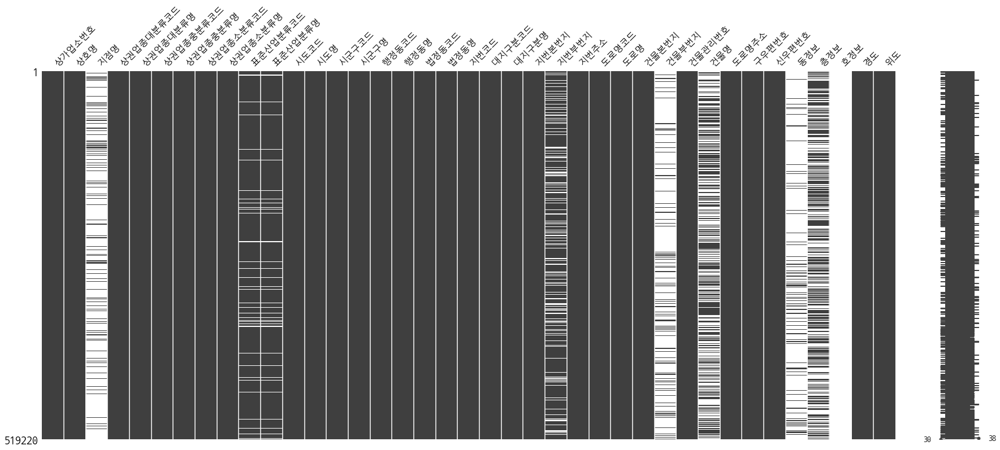

In [11]:
msno.matrix(shop_2022, figsize=(30, 12))
plt.show()

In [12]:
view_columns = ['상호명', '지점명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명', '시도명', '시군구명', 
                '행정동명', '법정동명', '지번주소', '도로명주소', '경도', '위도']
shop_202209 = shop_2022[view_columns]
shop_202209

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",126.907168,37.520613
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,"서울특별시 성동구 용답5길 2, (용답동)",127.049018,37.566857
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,"서울특별시 종로구 서순라길 17-10, (봉익동)",126.993530,37.571848
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,"서울특별시 서초구 동광로18길 82, (방배동)",126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...
519215,꾸미다뷰티,NaN,생활서비스,이/미용/건강,발/네일케어,부산광역시,동래구,수민동,수안동,부산광역시 동래구 수안동 40-13,"부산광역시 동래구 수안로8번길 35, (수안동)",129.089537,35.195231
519216,본가,꽃게아구,음식,한식,한식/백반/한정식,부산광역시,부산진구,가야1동,가야동,부산광역시 부산진구 가야동 56-2,"부산광역시 부산진구 가야대로 597, (가야동, 한신센타뷰)",129.036980,35.155247
519217,블루워시,하단점,생활서비스,세탁/가사서비스,세탁소/빨래방,부산광역시,사하구,하단2동,하단동,부산광역시 사하구 하단동 887-7,"부산광역시 사하구 하신번영로 302, (하단동, 헤를리치)",128.959048,35.108007
519218,몰운대,NaN,소매,종합소매점,수입품판매점,부산광역시,사하구,다대1동,다대동,부산광역시 사하구 다대동 1624,"부산광역시 사하구 다대낙조2길 100, (다대동)",128.965427,35.056377


In [13]:
del shop_2022

In [14]:
shop_202209.isnull().sum()

상호명              1
지점명         434229
상권업종대분류명         0
상권업종중분류명         0
상권업종소분류명         0
시도명              0
시군구명             0
행정동명             0
법정동명             0
지번주소             0
도로명주소            0
경도               0
위도               0
dtype: int64

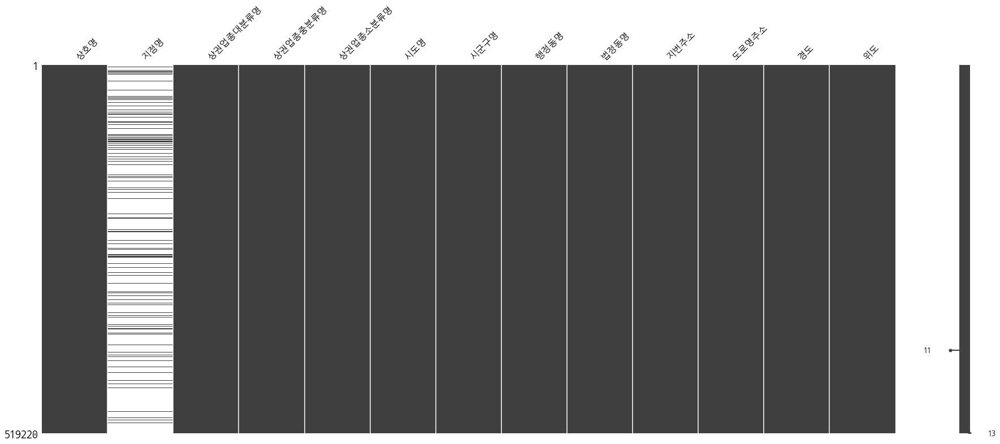

In [15]:
msno.matrix(shop_202209, figsize=(30, 12))
plt.show()

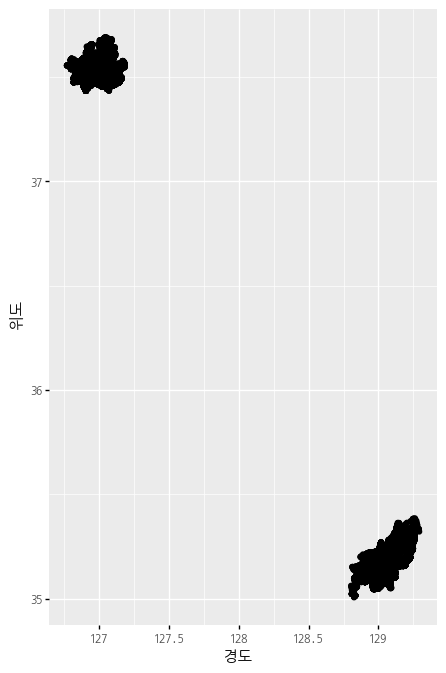

<ggplot: (126569194402)>

In [16]:
(
    ggplot(shop_202209, aes(x='경도', y='위도'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(5, 8))
)

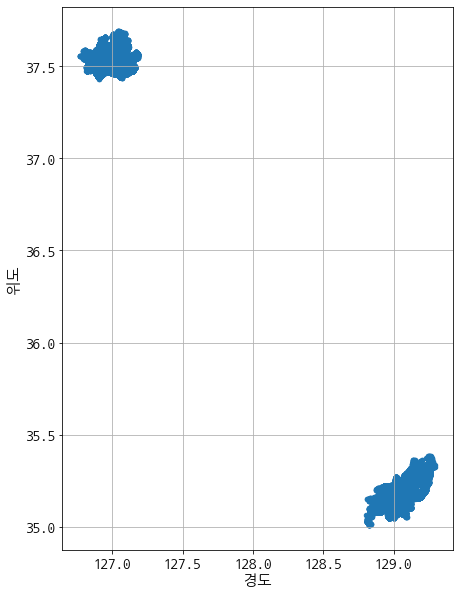

In [17]:
shop_202209.plot.scatter(x='경도', y='위도', grid=True, figsize=(7, 10))
plt.show()

In [18]:
shop_202209

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",126.907168,37.520613
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,"서울특별시 성동구 용답5길 2, (용답동)",127.049018,37.566857
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,"서울특별시 종로구 서순라길 17-10, (봉익동)",126.993530,37.571848
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,"서울특별시 서초구 동광로18길 82, (방배동)",126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...
519215,꾸미다뷰티,NaN,생활서비스,이/미용/건강,발/네일케어,부산광역시,동래구,수민동,수안동,부산광역시 동래구 수안동 40-13,"부산광역시 동래구 수안로8번길 35, (수안동)",129.089537,35.195231
519216,본가,꽃게아구,음식,한식,한식/백반/한정식,부산광역시,부산진구,가야1동,가야동,부산광역시 부산진구 가야동 56-2,"부산광역시 부산진구 가야대로 597, (가야동, 한신센타뷰)",129.036980,35.155247
519217,블루워시,하단점,생활서비스,세탁/가사서비스,세탁소/빨래방,부산광역시,사하구,하단2동,하단동,부산광역시 사하구 하단동 887-7,"부산광역시 사하구 하신번영로 302, (하단동, 헤를리치)",128.959048,35.108007
519218,몰운대,NaN,소매,종합소매점,수입품판매점,부산광역시,사하구,다대1동,다대동,부산광역시 사하구 다대동 1624,"부산광역시 사하구 다대낙조2길 100, (다대동)",128.965427,35.056377


데이터프레임에서 서울 데이터만 추출한다.

In [19]:
# 시도명 열에 '서울특별시'라고만 입력이 되어있다면 아래와 같이 실행하면 된다.
# shop_202209[shop_202209['시도명'] == '서울특별시']
# shop_202209.loc[shop_202209['시도명'] == '서울특별시']

# 시도명 열에 '서울특별시', '서울', '서울시'와 같이 입력값이 혼재되어 있다면 아래와 같이 논리 연산을 실행해야 한다.
# 판다스에서 불린 인덱싱시 and 조건은 '&'를 사용하고 or 조건은 '|'를 사용한다.
# and, or 조건 지정시 관계 연산자가 사용된 부분(브로드캐스팅이 실행되는 부분)을 반드시 ()로 묶어야 한다.
# shop_202209[(shop_202209['시도명'] == '서울특별시') | (shop_202209['시도명'] == '서울') | (shop_202209['시도명'] == '서울시')]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값을 앞 2글자가 서울인 데이터를 얻어온다.
# shop_202209[shop_202209.시도명.str[:2] == '서울']
# shop_202209[shop_202209.지번주소.str[:2] == '서울']
# shop_202209[shop_202209.도로명주소.str[:2] == '서울']
# shop_202209[shop_202209.도로명주소.str.find('서울') >= 0]
# shop_202209[shop_202209.도로명주소.str.count('서울') >= 1]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값이 서울로 시작하는 데이터를 얻어온다.
# startswith() 함수는 인수로 지정된 문자열로 시작하면 True, 그렇치 않으면 False를 리턴한다.
# endswith() 함수는 인수로 지정된 문자열로 끝나면 True, 그렇치 않으면 False를 리턴한다.
shop_seoul = shop_202209[shop_202209.시도명.str.startswith('서울')]
shop_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",126.907168,37.520613
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,"서울특별시 성동구 용답5길 2, (용답동)",127.049018,37.566857
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,"서울특별시 종로구 서순라길 17-10, (봉익동)",126.993530,37.571848
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,"서울특별시 서초구 동광로18길 82, (방배동)",126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...
361485,밀스튜디오,NaN,소매,의복의류,여성의류전문점,서울특별시,강서구,등촌1동,등촌동,서울특별시 강서구 등촌동 639-11,"서울특별시 강서구 화곡로 398, (등촌동)",126.854800,37.558456
361486,챔프컴퍼니,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배1동,방배동,서울특별시 서초구 방배동 938-24,"서울특별시 서초구 방배로23길 32-4, (방배동)",126.992590,37.486042
361487,제라클,NaN,소매,가방/신발/액세서리,액세서리판매,서울특별시,서초구,양재1동,양재동,서울특별시 서초구 양재동 82-18,"서울특별시 서초구 논현로27길 74, (양재동)",127.040527,37.478638
361488,아이에스에이주차타워,NaN,생활서비스,자동차/이륜차,주차장운영,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 신사동 600,"서울특별시 강남구 압구정로30길 51, (신사동)",127.029347,37.523924


In [20]:
# '~'는 ~가 아닌것을 의미한다. => 논리부정, not 연산자
shop_expect_seoul = shop_202209[~shop_202209.시도명.str.startswith('서울')]
shop_expect_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
361490,미광장,NaN,숙박,모텔/여관/여인숙,모텔/여관/여인숙,부산광역시,중구,부평동,부평동4가,부산광역시 중구 부평동4가 25-1,"부산광역시 중구 보수대로44번길 5, (부평동4가)",129.023668,35.100979
361491,BHC치킨,동래점,음식,닭/오리요리,후라이드/양념치킨,부산광역시,동래구,복산동,복천동,부산광역시 동래구 복천동 185,"부산광역시 동래구 동래로147번길 18, (복천동)",129.087156,35.205267
361492,스텔라,NaN,소매,의복의류,일반의류,부산광역시,수영구,남천2동,남천동,부산광역시 수영구 남천동 148-4,"부산광역시 수영구 광안해변로 100, (남천동, 삼익비치)",129.115397,35.143770
361493,도란도란,NaN,음식,한식,한식/백반/한정식,부산광역시,부산진구,개금1동,개금동,부산광역시 부산진구 개금동 174-4,"부산광역시 부산진구 가야대로482번길 29-3, (개금동)",129.024938,35.151645
361494,럭키사진관,NaN,생활서비스,사진,사진관,부산광역시,사하구,당리동,당리동,부산광역시 사하구 당리동 325-30,"부산광역시 사하구 낙동대로 395, (당리동)",128.974794,35.102905
...,...,...,...,...,...,...,...,...,...,...,...,...,...
519215,꾸미다뷰티,NaN,생활서비스,이/미용/건강,발/네일케어,부산광역시,동래구,수민동,수안동,부산광역시 동래구 수안동 40-13,"부산광역시 동래구 수안로8번길 35, (수안동)",129.089537,35.195231
519216,본가,꽃게아구,음식,한식,한식/백반/한정식,부산광역시,부산진구,가야1동,가야동,부산광역시 부산진구 가야동 56-2,"부산광역시 부산진구 가야대로 597, (가야동, 한신센타뷰)",129.036980,35.155247
519217,블루워시,하단점,생활서비스,세탁/가사서비스,세탁소/빨래방,부산광역시,사하구,하단2동,하단동,부산광역시 사하구 하단동 887-7,"부산광역시 사하구 하신번영로 302, (하단동, 헤를리치)",128.959048,35.108007
519218,몰운대,NaN,소매,종합소매점,수입품판매점,부산광역시,사하구,다대1동,다대동,부산광역시 사하구 다대동 1624,"부산광역시 사하구 다대낙조2길 100, (다대동)",128.965427,35.056377


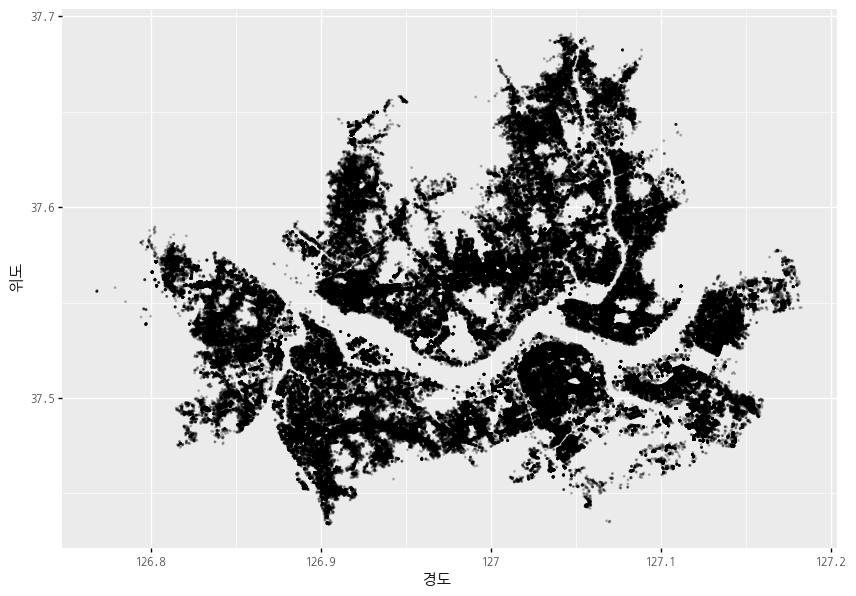

<ggplot: (126569596771)>

In [21]:
# 서울만 시각화해보면 서울 지도하고 비슷하게 나온다.
(
    ggplot(shop_seoul, aes(x='경도', y='위도'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
)

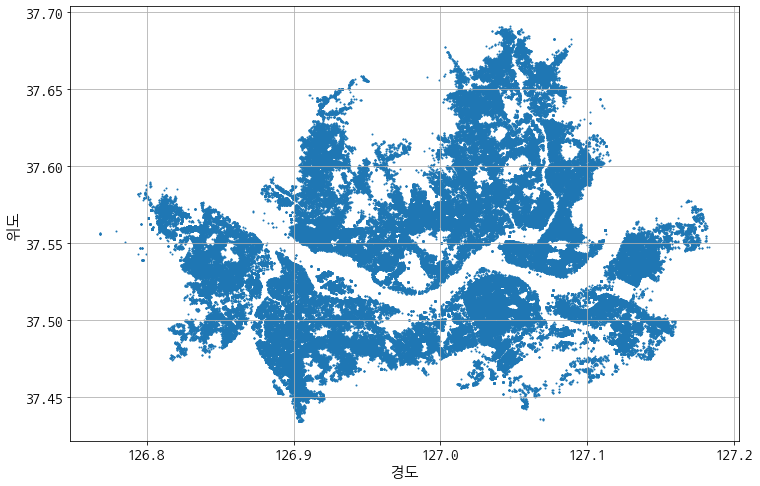

In [22]:
shop_seoul.plot.scatter(x='경도', y='위도', grid=True, figsize=(12, 8), s=1)
plt.show()

shop_202209 데이터프레임의 도로명주소를 활용해서 '시도', '구군' 열을 만든다.

In [23]:
# split() 함수에 expand=True 옵션을 지정해서 공백을 경계로 문자열을 서로 다른 열(데이터프레임)로 구분해서 '시도'열과 
# '구군'열을 만든다.
print(shop_202209[:1].도로명주소) # <class 'pandas.core.series.Series'>
print('=' * 80)
print(shop_202209[:1].도로명주소.str) # <class 'pandas.core.strings.StringMethods'>
print('=' * 80)
print(shop_202209[:1].도로명주소.str.split()) # <class 'pandas.core.series.Series'>
print('=' * 80)
# expand=True 옵션을 지정하면 구분자를 경계로 문자열을 구분해서 데이터프레임으로 리턴한다. => 여러개의 열로 나눈다.
print(shop_202209[:1].도로명주소.str.split(' ', expand=True)) # <class 'pandas.core.frame.DataFrame'>
print('=' * 80)
print(shop_202209[:1].도로명주소.str.split(' ', expand=True)[0]) # 데이터프레임의 0이라는 컬럼을 얻어온다.
print(shop_202209[:1].도로명주소.str.split(' ', expand=True)[1]) # 데이터프레임의 1이라는 컬럼을 얻어온다.

0    서울특별시 영등포구 영중로14길 11-17, (영등포동5가)
Name: 도로명주소, dtype: object
0    [서울특별시, 영등포구, 영중로14길, 11-17,, (영등포동5가)]
Name: 도로명주소, dtype: object
       0     1       2       3         4
0  서울특별시  영등포구  영중로14길  11-17,  (영등포동5가)
0    서울특별시
Name: 0, dtype: object
0    영등포구
Name: 1, dtype: object


In [24]:
shop_202209['시도'] = shop_202209['도로명주소'].str.split(' ', expand=True)[0]
shop_202209['구군'] = shop_202209.도로명주소.str.split(' ', expand=True)[1]
shop_202209

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",126.907168,37.520613,서울특별시,영등포구
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,"서울특별시 성동구 용답5길 2, (용답동)",127.049018,37.566857,서울특별시,성동구
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,"서울특별시 종로구 서순라길 17-10, (봉익동)",126.993530,37.571848,서울특별시,종로구
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967,서울특별시,송파구
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,"서울특별시 서초구 동광로18길 82, (방배동)",126.991394,37.488375,서울특별시,서초구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519215,꾸미다뷰티,NaN,생활서비스,이/미용/건강,발/네일케어,부산광역시,동래구,수민동,수안동,부산광역시 동래구 수안동 40-13,"부산광역시 동래구 수안로8번길 35, (수안동)",129.089537,35.195231,부산광역시,동래구
519216,본가,꽃게아구,음식,한식,한식/백반/한정식,부산광역시,부산진구,가야1동,가야동,부산광역시 부산진구 가야동 56-2,"부산광역시 부산진구 가야대로 597, (가야동, 한신센타뷰)",129.036980,35.155247,부산광역시,부산진구
519217,블루워시,하단점,생활서비스,세탁/가사서비스,세탁소/빨래방,부산광역시,사하구,하단2동,하단동,부산광역시 사하구 하단동 887-7,"부산광역시 사하구 하신번영로 302, (하단동, 헤를리치)",128.959048,35.108007,부산광역시,사하구
519218,몰운대,NaN,소매,종합소매점,수입품판매점,부산광역시,사하구,다대1동,다대동,부산광역시 사하구 다대동 1624,"부산광역시 사하구 다대낙조2길 100, (다대동)",128.965427,35.056377,부산광역시,사하구


In [25]:
# '시도'열과 '구군'열이 추가된 원본 데이터프레임에서 서울만 다시 추출해 서울 데이터프레임을 만든다.
shop_seoul = shop_202209[shop_202209.시도명.str.startswith('서울')]
shop_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,"서울특별시 영등포구 영중로14길 11-17, (영등포동5가)",126.907168,37.520613,서울특별시,영등포구
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,"서울특별시 성동구 용답5길 2, (용답동)",127.049018,37.566857,서울특별시,성동구
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,"서울특별시 종로구 서순라길 17-10, (봉익동)",126.993530,37.571848,서울특별시,종로구
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967,서울특별시,송파구
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,"서울특별시 서초구 동광로18길 82, (방배동)",126.991394,37.488375,서울특별시,서초구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361485,밀스튜디오,NaN,소매,의복의류,여성의류전문점,서울특별시,강서구,등촌1동,등촌동,서울특별시 강서구 등촌동 639-11,"서울특별시 강서구 화곡로 398, (등촌동)",126.854800,37.558456,서울특별시,강서구
361486,챔프컴퍼니,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배1동,방배동,서울특별시 서초구 방배동 938-24,"서울특별시 서초구 방배로23길 32-4, (방배동)",126.992590,37.486042,서울특별시,서초구
361487,제라클,NaN,소매,가방/신발/액세서리,액세서리판매,서울특별시,서초구,양재1동,양재동,서울특별시 서초구 양재동 82-18,"서울특별시 서초구 논현로27길 74, (양재동)",127.040527,37.478638,서울특별시,서초구
361488,아이에스에이주차타워,NaN,생활서비스,자동차/이륜차,주차장운영,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 신사동 600,"서울특별시 강남구 압구정로30길 51, (신사동)",127.029347,37.523924,서울특별시,강남구


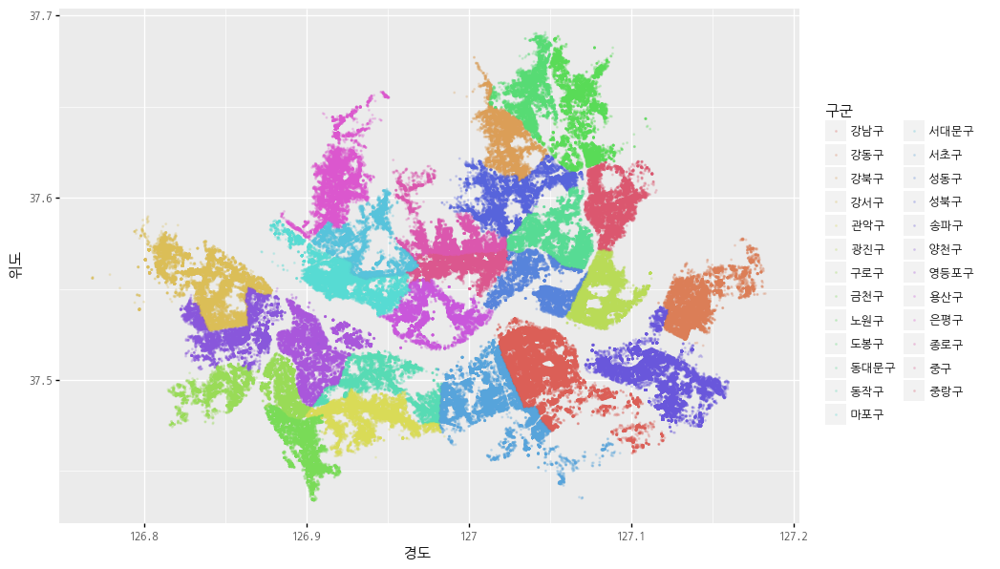

<ggplot: (-9223371910293463394)>

In [26]:
(
    ggplot(shop_seoul, aes(x='경도', y='위도', color='구군'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
)

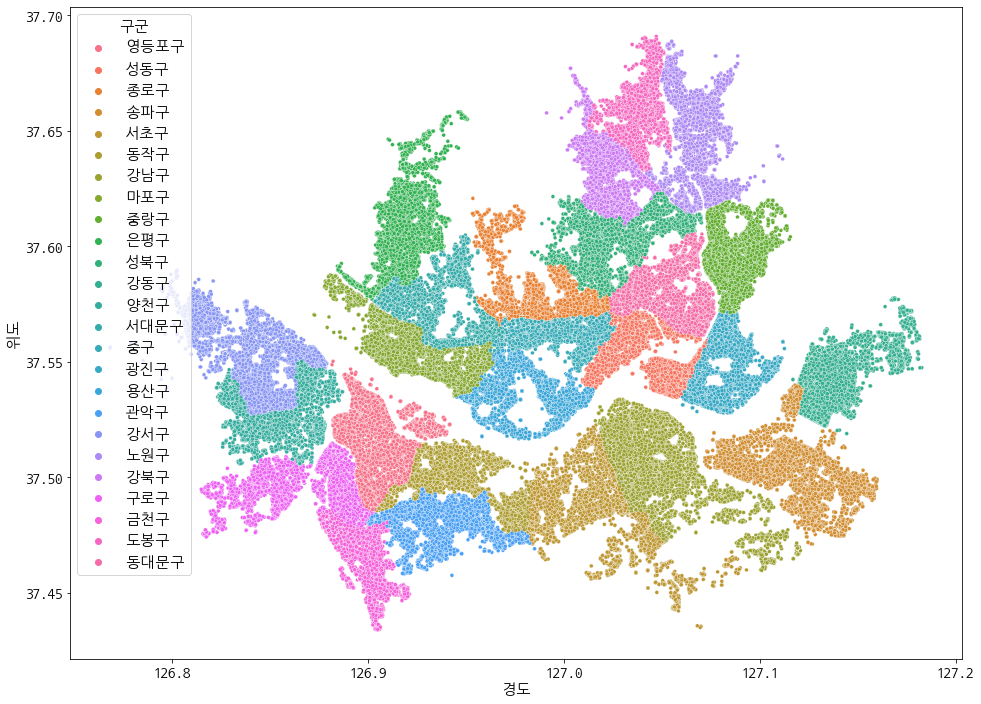

In [27]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul, x='경도', y='위도', s=15, hue='구군')
plt.show()

In [28]:
set(shop_seoul.상권업종대분류명)

{'관광/여가/오락', '부동산', '생활서비스', '소매', '숙박', '스포츠', '음식', '학문/교육'}

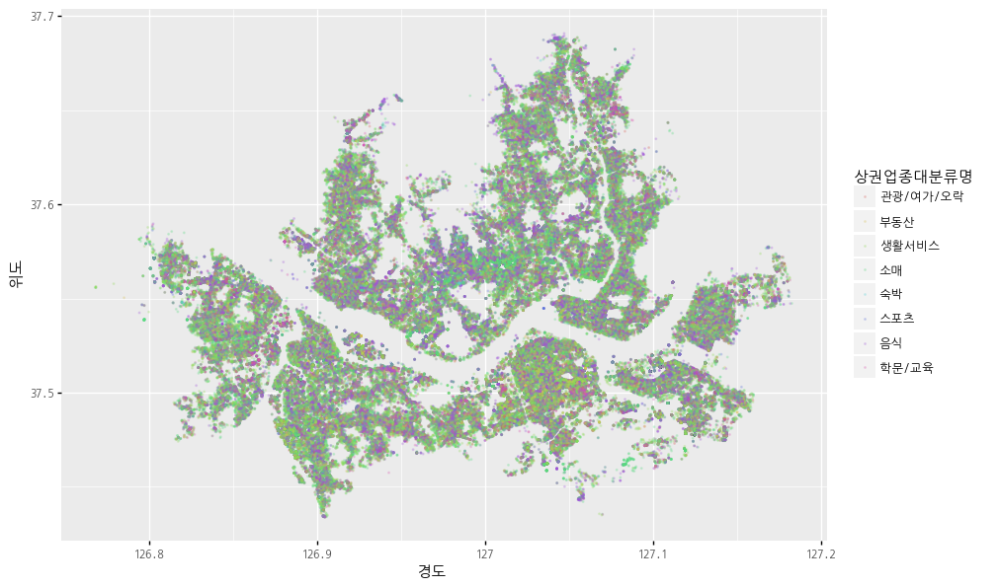

<ggplot: (126569868401)>

In [29]:
(
    ggplot(shop_seoul, aes(x='경도', y='위도', color='상권업종대분류명'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

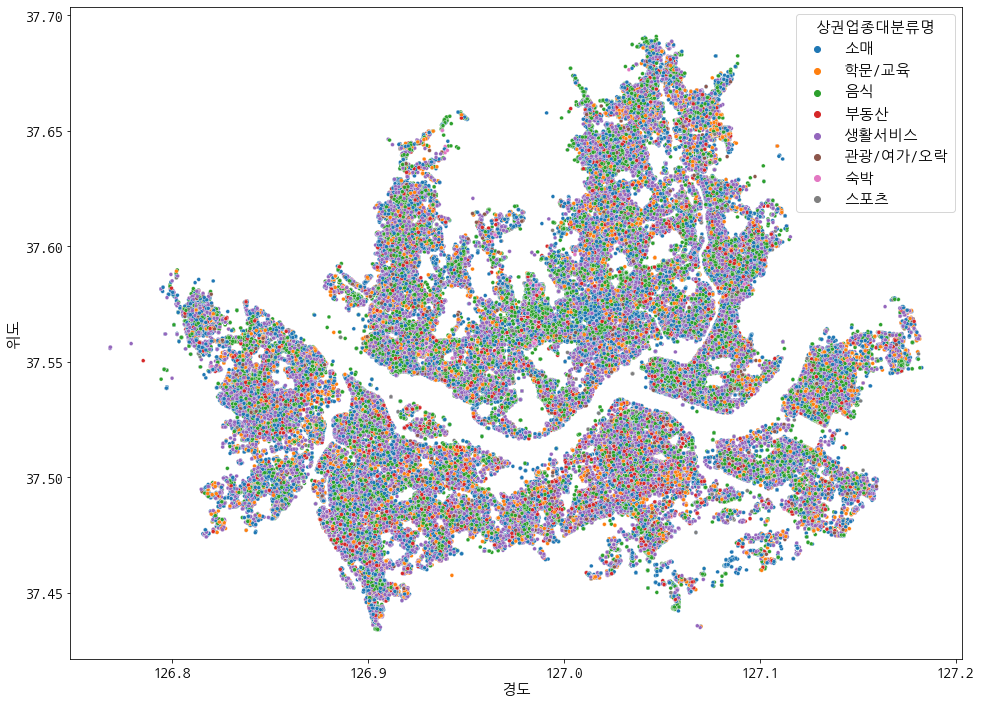

In [30]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul, x='경도', y='위도', s=15, hue='상권업종대분류명')
plt.show()

학문/교육과 관련된 정보 보기

In [31]:
shop_seoul_edu = shop_seoul[shop_seoul.상권업종대분류명 == '학문/교육']
shop_seoul_edu

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,"서울특별시 송파구 위례성대로12길 31, (방이동)",127.121520,37.510967,서울특별시,송파구
8,무비디자인,NaN,학문/교육,학원-창업취업취미,학원-디자인,서울특별시,마포구,대흥동,노고산동,서울특별시 마포구 노고산동 107-17,"서울특별시 마포구 백범로 8, (노고산동)",126.936717,37.553996,서울특별시,마포구
18,힐리빙텔,NaN,학문/교육,도서관/독서실,독서실,서울특별시,서대문구,신촌동,대현동,서울특별시 서대문구 대현동 37-69,"서울특별시 서대문구 이화여대5길 28, (대현동)",126.944057,37.558414,서울특별시,서대문구
19,김샘수학교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,중구,신당5동,신당동,서울특별시 중구 신당동 851,"서울특별시 중구 퇴계로90길 74, (신당동, 래미안하이베르아파트)",127.020965,37.560996,서울특별시,중구
43,노바수학학원,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,강남구,일원2동,개포동,서울특별시 강남구 개포동 12-4,"서울특별시 강남구 개포로 615, (개포동)",127.075573,37.492649,서울특별시,강남구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361396,발돋움국어,NaN,학문/교육,학원-어학,학원-외국어/어학,서울특별시,동대문구,휘경1동,휘경동,서울특별시 동대문구 휘경동 183-128,"서울특별시 동대문구 회기로29길 12, (휘경동)",127.058136,37.590654,서울특별시,동대문구
361408,길동리드인독서논술교습소,NaN,학문/교육,학원기타,학원(종합),서울특별시,강동구,길동,길동,서울특별시 강동구 길동 125-8,"서울특별시 강동구 명일로 212, (길동)",127.146159,37.537513,서울특별시,강동구
361414,공방순수,NaN,학문/교육,학원기타,학원-기타,서울특별시,관악구,은천동,봉천동,서울특별시 관악구 봉천동 1718,"서울특별시 관악구 은천로 93, (봉천동, 벽산블루밍아파트)",126.945884,37.487337,서울특별시,관악구
361467,수학교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,강남구,대치4동,대치동,서울특별시 강남구 대치동 931-1,"서울특별시 강남구 삼성로67길 3, (대치동)",127.059093,37.501097,서울특별시,강남구


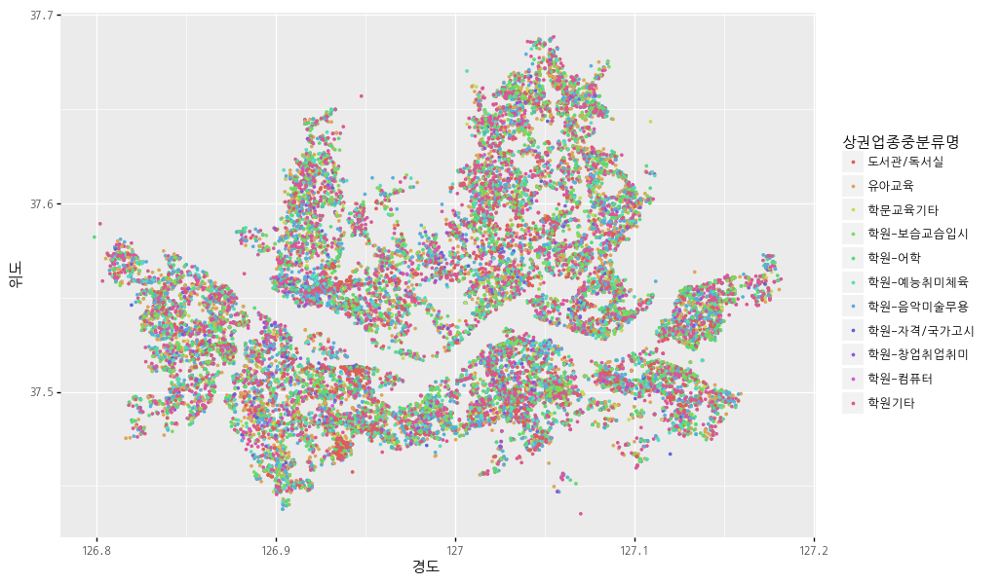

<ggplot: (-9223371910235619079)>

In [32]:
(
    ggplot(shop_seoul_edu, aes(x='경도', y='위도', color='상권업종중분류명'))
        + geom_point(size=0.5, alpha=1.0)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

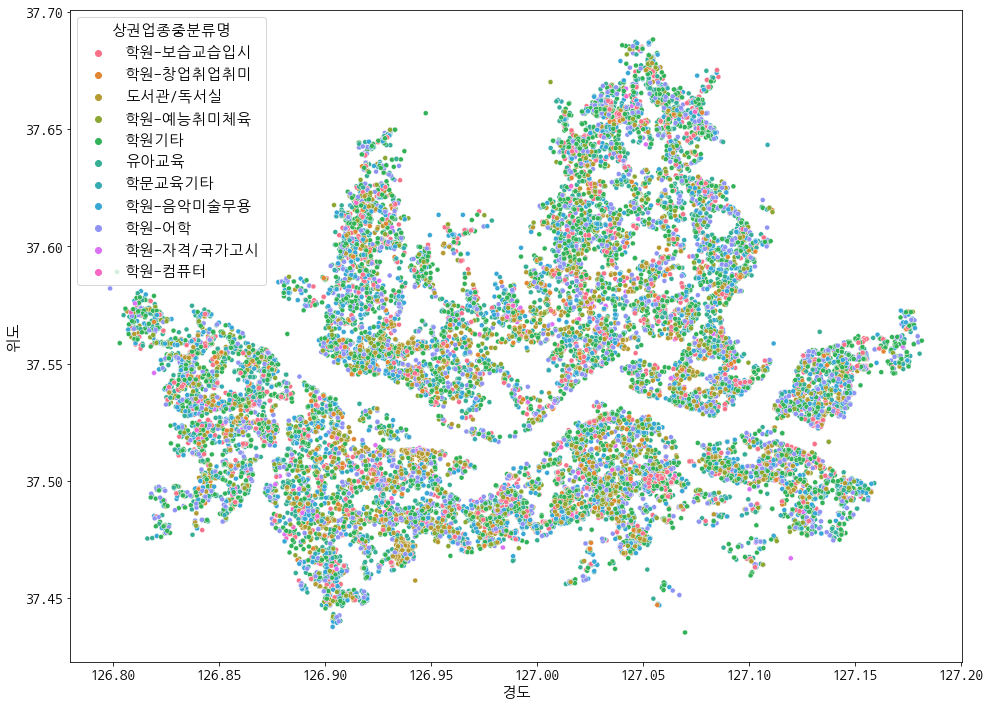

In [33]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_edu, x='경도', y='위도', s=25, hue='상권업종중분류명')
plt.show()

부동산과 관련된 정보 보기

In [34]:
shop_seoul_realty = shop_seoul[shop_seoul.상권업종대분류명 == '부동산']
shop_seoul_realty

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
10,연세공인중개사사무소,NaN,부동산,부동산중개,부동산중개,서울특별시,은평구,역촌동,역촌동,서울특별시 은평구 역촌동 17-15,"서울특별시 은평구 진흥로 101, (역촌동)",126.922332,37.605891,서울특별시,은평구
33,미래공인중개사,NaN,부동산,부동산중개,부동산중개,서울특별시,송파구,오금동,오금동,서울특별시 송파구 오금동 43,"서울특별시 송파구 오금로35길 17, (오금동, 현대아파트)",127.127342,37.506388,서울특별시,송파구
36,대성부동산,NaN,부동산,부동산중개,부동산중개,서울특별시,용산구,이촌2동,이촌동,서울특별시 용산구 이촌동 203-61,"서울특별시 용산구 이촌로22길 20, (이촌동)",126.955577,37.525295,서울특별시,용산구
47,럭키공인,NaN,부동산,부동산중개,부동산중개,서울특별시,강남구,도곡1동,도곡동,서울특별시 강남구 도곡동 959-3,"서울특별시 강남구 남부순환로359길 34, (도곡동)",127.035670,37.487032,서울특별시,강남구
58,행복공인중개사무소,NaN,부동산,부동산중개,부동산중개,서울특별시,강동구,성내1동,성내동,서울특별시 강동구 성내동 465,"서울특별시 강동구 성내로14길 27, (성내동)",127.126609,37.526602,서울특별시,강동구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361464,케이플러스부동산중개법인,NaN,부동산,부동산중개,부동산중개,서울특별시,종로구,사직동,내수동,서울특별시 종로구 내수동 75,"서울특별시 종로구 새문안로3길 36, (내수동, 용비어천가)",126.973279,37.573412,서울특별시,종로구
361466,케이엠컨설팅,NaN,부동산,평가/개발/관리,부동산자문,서울특별시,강서구,가양1동,가양동,서울특별시 강서구 가양동 131-3,"서울특별시 강서구 양천로 358, (가양동)",126.842015,37.567693,서울특별시,강서구
361468,삼마프라퍼티,NaN,부동산,분양,건물분양-종합,서울특별시,강남구,역삼2동,역삼동,서울특별시 강남구 역삼동 733-11,"서울특별시 강남구 논현로76길 24, (역삼동)",127.040762,37.497346,서울특별시,강남구
361473,모수,NaN,부동산,부동산중개,부동산중개,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 서초동 1554-9,"서울특별시 서초구 반포대로30길 43, (서초동)",127.010894,37.492279,서울특별시,서초구


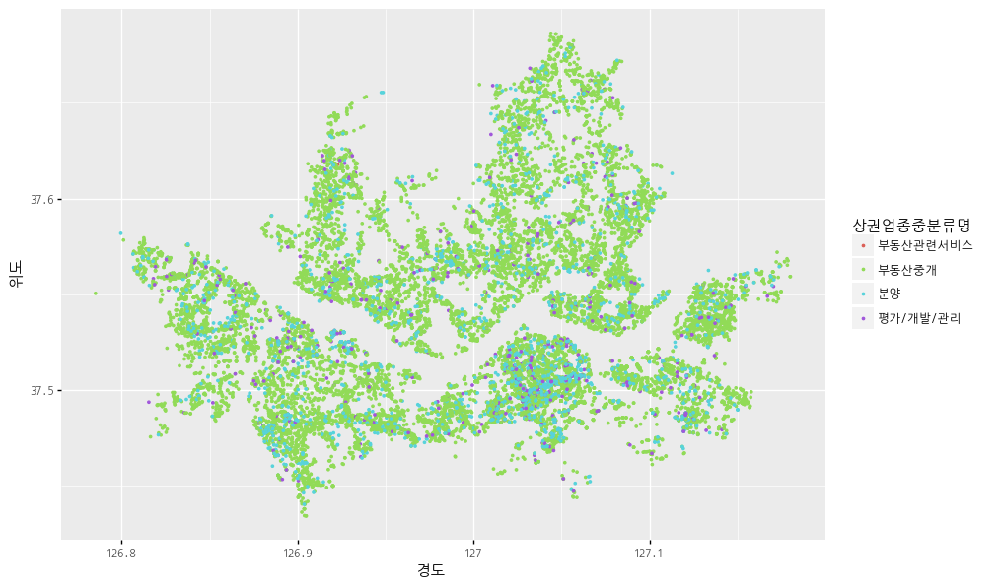

<ggplot: (-9223371910230586080)>

In [35]:
(
    ggplot(shop_seoul_realty, aes(x='경도', y='위도', color='상권업종중분류명'))
        + geom_point(size=0.5, alpha=1.0)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

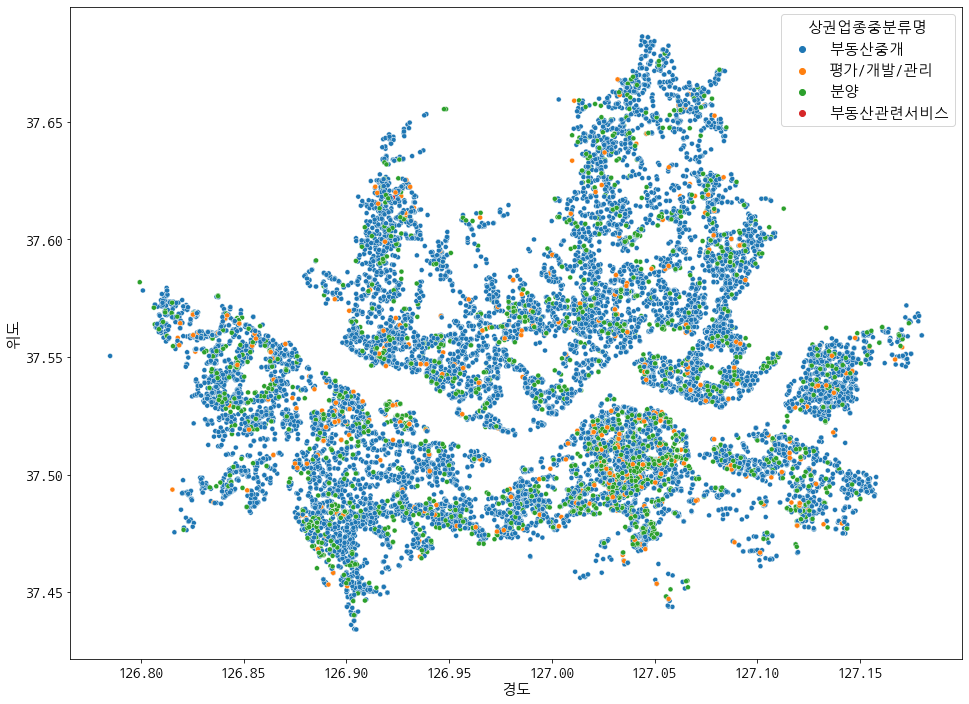

In [36]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_realty, x='경도', y='위도', s=25, hue='상권업종중분류명')
plt.show()

In [37]:
set(shop_seoul_edu.상권업종중분류명)

{'도서관/독서실',
 '유아교육',
 '학문교육기타',
 '학원-보습교습입시',
 '학원-어학',
 '학원-예능취미체육',
 '학원-음악미술무용',
 '학원-자격/국가고시',
 '학원-창업취업취미',
 '학원-컴퓨터',
 '학원기타'}

In [38]:
shop_seoul_edu_computer = shop_seoul[shop_seoul.상권업종중분류명 == '학원-컴퓨터']
shop_seoul_edu_computer

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
4888,진원컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 28-6,"서울특별시 양천구 화곡로 41, (신월동)",126.826484,37.539544,서울특별시,양천구
5664,대성컴퓨터회계학원,대성컴퓨터회계,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,관악구,인헌동,봉천동,서울특별시 관악구 봉천동 1657-24,"서울특별시 관악구 남부순환로 1952, (봉천동)",126.965659,37.475943,서울특별시,관악구
7079,구로컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,금천구,시흥1동,시흥동,서울특별시 금천구 시흥동 870-10,"서울특별시 금천구 시흥대로 266, (시흥동)",126.899903,37.457508,서울특별시,금천구
13857,아몬정보컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,중랑구,중화1동,중화동,서울특별시 중랑구 중화동 290-5,"서울특별시 중랑구 동일로130길 39, (중화동)",127.082118,37.599980,서울특별시,중랑구
15424,구미컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 816-3,"서울특별시 강남구 강남대로 416, (역삼동)",127.027137,37.499793,서울특별시,강남구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330119,코딩온도화점코딩교습소,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,마포구,도화동,도화동,서울특별시 마포구 도화동 347-66,"서울특별시 마포구 도화2길 53, (도화동)",126.950412,37.538656,서울특별시,마포구
334417,학원,한국드론기술,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,금천구,가산동,가산동,서울특별시 금천구 가산동 60-17,"서울특별시 금천구 디지털로9길 65, (가산동)",126.885233,37.480257,서울특별시,금천구
349707,학원,잼코딩서초,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,서초구,서초1동,서초동,서울특별시 서초구 서초동 1603-9,"서울특별시 서초구 서초중앙로 40-6, (서초동)",127.016443,37.485648,서울특별시,서초구
354096,메타코딩컴퓨터교습소,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,양천구,신월4동,신월동,서울특별시 양천구 신월동 439-16,"서울특별시 양천구 오목로 19, (신월동, 서륭타운)",126.839661,37.521645,서울특별시,양천구


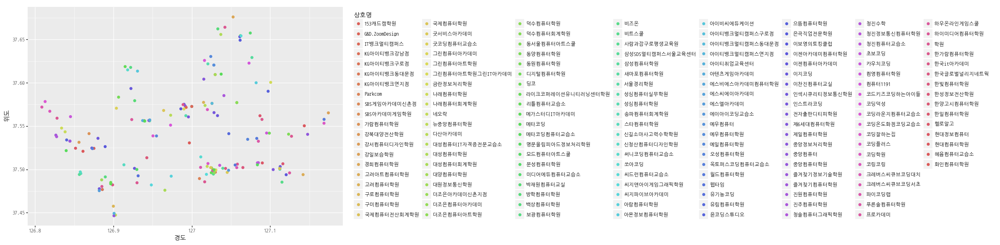

<ggplot: (126629200886)>

In [39]:
(
    ggplot(shop_seoul_edu_computer, aes(x='경도', y='위도', color='상호명'))
        + geom_point(size=2, alpha=1.0)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

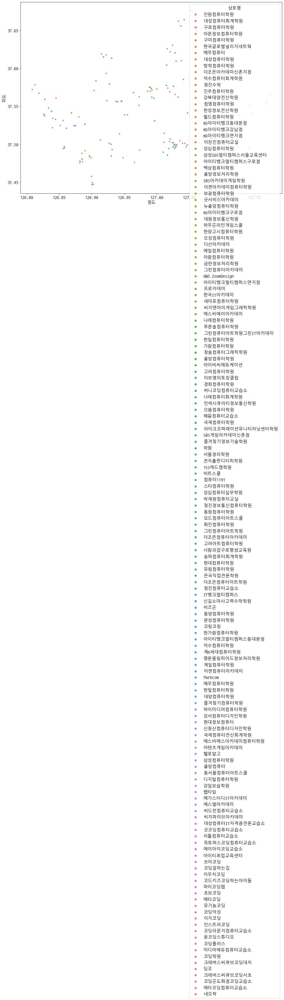

In [40]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_edu_computer, x='경도', y='위도', s=25, hue='상호명')
plt.show()

filoum Map 컴퓨터 학원 위치 시각화

In [41]:
import folium

In [42]:
data = shop_seoul_edu_computer
edu_map = folium.Map(location=[data['위도'].mean(), data['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')

'''
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu['상호명'], edu['도로명주소']), max_width=300)
    folium.Marker(location=[edu['위도'], edu['경도']], popup=popup).add_to(edu_map)
'''

for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.Marker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup).add_to(edu_map)

edu_map.save('./output/edu_map.html')
edu_map

In [43]:
set(shop_seoul.상권업종중분류명)

{'PC/오락/당구/볼링등',
 '가구소매',
 '가방/신발/액세서리',
 '가전제품소매',
 '가정/주방/인테리어',
 '개인/가정용품수리',
 '개인서비스',
 '건강/미용식품',
 '경마/경륜/성인오락',
 '광고/인쇄',
 '기타서비스업',
 '기타음식업',
 '기타판매업',
 '놀이/여가/취미',
 '닭/오리요리',
 '대중목욕탕/휴게',
 '대행업',
 '도서관/독서실',
 '모텔/여관/여인숙',
 '무도/유흥/가무',
 '물품기기대여',
 '민박/하숙',
 '법무세무회계',
 '별식/퓨전요리',
 '부동산관련서비스',
 '부동산중개',
 '부페',
 '분식',
 '분양',
 '사무/문구/컴퓨터',
 '사진',
 '사진/광학/정밀기기소매',
 '선물/팬시/기념품',
 '세탁/가사서비스',
 '스포츠/운동',
 '시계/귀금속소매',
 '실내운동시설',
 '실외운동시설',
 '애견/애완/동물',
 '양식',
 '연극/영화/극장',
 '예술품/골동품/수석/분재',
 '예식/의례/관혼상제',
 '요가/단전/마사지',
 '운동/경기용품소매',
 '운송/배달/택배',
 '운영관리시설',
 '유스호스텔',
 '유아교육',
 '유아용품',
 '유흥주점',
 '음/식료품소매',
 '음식배달서비스',
 '의복의류',
 '의약/의료품소매',
 '이/미용/건강',
 '인력/고용/용역알선',
 '일식/수산물',
 '자동차/이륜차',
 '자동차/자동차용품',
 '장례/묘지',
 '제과제빵떡케익',
 '종교용품판매',
 '종합소매점',
 '주유소/충전소',
 '주택수리',
 '중고품소매/교환',
 '중식',
 '책/서적/도서',
 '철물/난방/건설자재소매',
 '취미/오락관련소매',
 '캠프/별장/펜션',
 '커피점/카페',
 '패스트푸드',
 '페인트/유리제품소매',
 '평가/개발/관리',
 '학문교육기타',
 '학원-보습교습입시',
 '학원-어학',
 '학원-예능취미체육',
 '학원-음악미술무용',
 '학원-자격/국가고시',
 '학원-창업취업취미',
 '학원-컴퓨터',
 

In [44]:
shop_seoul_cafe = shop_seoul[shop_seoul.상권업종중분류명 == '커피점/카페']
shop_seoul_cafe

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군
20,커피빈,코리아대학로대명거리점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,혜화동,명륜4가,서울특별시 종로구 명륜4가 51,"서울특별시 종로구 대명길 25, (명륜4가)",127.000171,37.583149,서울특별시,종로구
97,요거프레소,쌍문점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,도봉구,쌍문2동,쌍문동,서울특별시 도봉구 쌍문동 20,"서울특별시 도봉구 도당로 7, (쌍문동, 벽산프라자)",127.034746,37.658728,서울특별시,도봉구
188,우성커피숍,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,양천구,신월4동,신월동,서울특별시 양천구 신월동 514-2,"서울특별시 양천구 오목로 48, (신월동)",126.842935,37.522055,서울특별시,양천구
195,버블베어,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강서구,방화3동,방화동,서울특별시 강서구 방화동 819,"서울특별시 강서구 금낭화로 167, (방화동, 개화)",126.813358,37.580941,서울특별시,강서구
230,알뤼르,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,대치4동,대치동,서울특별시 강남구 대치동 894,"서울특별시 강남구 삼성로85길 33, (대치동, 현대썬앤빌테헤란)",127.054731,37.504378,서울특별시,강남구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361388,공유KYOUYUU,2호점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 45-14,"서울특별시 성동구 용답25길 22, (용답동)",127.052731,37.562363,서울특별시,성동구
361389,운비차실,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,중구,회현동,회현동1가,서울특별시 중구 회현동1가 172-4,"서울특별시 중구 퇴계로6길 17, (회현동1가)",126.978534,37.557465,서울특별시,중구
361462,풀꽃,NaN,음식,커피점/카페,전통찻집/인삼찻집,서울특별시,강동구,암사3동,암사동,서울특별시 강동구 암사동 441-10,"서울특별시 강동구 고덕로 47, 101동 (암사동, 정산아파트)",127.130397,37.555004,서울특별시,강동구
361472,댄싱컵,가재울점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,서대문구,남가좌2동,남가좌동,서울특별시 서대문구 남가좌동 390,"서울특별시 서대문구 거북골로 100, (남가좌동, 래미안루센티아)",126.918228,37.575633,서울특별시,서대문구


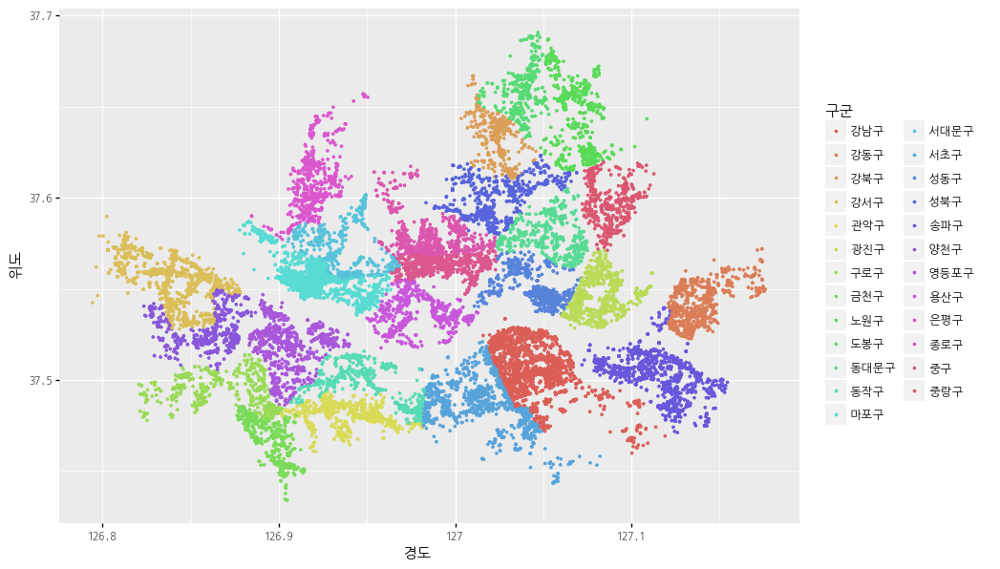

<ggplot: (-9223371910255761292)>

In [45]:
(
    ggplot(shop_seoul_cafe, aes(x='경도', y='위도', color='구군'))
        + geom_point(size=0.5, alpha=1.0)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

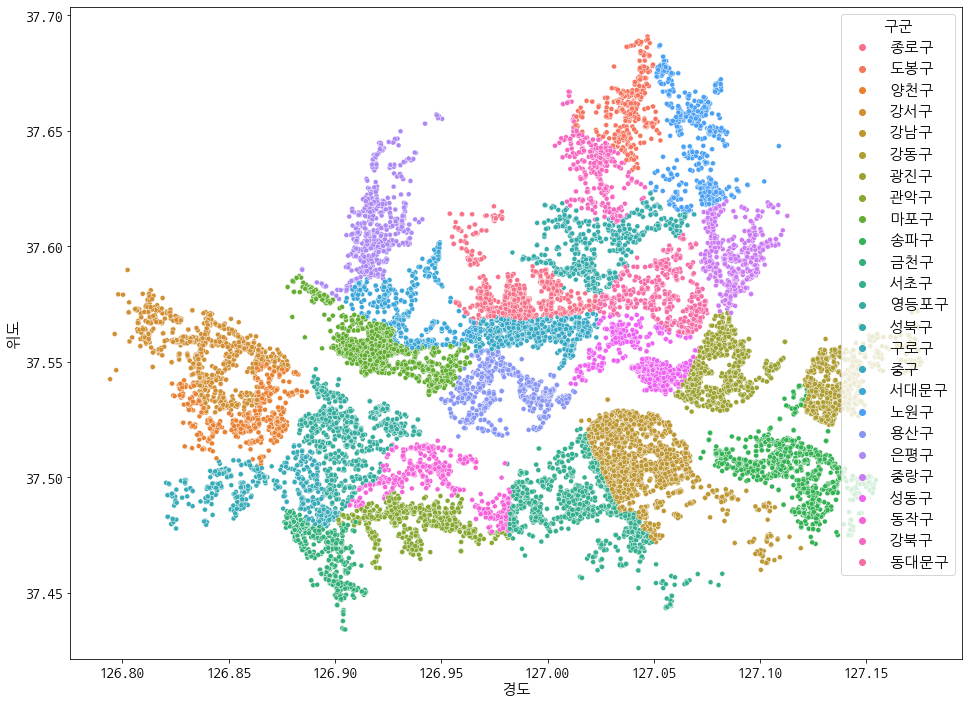

In [46]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_cafe, x='경도', y='위도', s=25, hue='구군')
plt.show()

In [47]:
data = shop_seoul_cafe[shop_seoul_cafe['상호명'].str.find('이디야') >= 0]
cafe_map = folium.Map(location=[data['위도'].mean(), data['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='blue').add_to(cafe_map)

data = shop_seoul_cafe[shop_seoul_cafe['상호명'].str.find('스타벅스') >= 0]
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='green').add_to(cafe_map)
    
cafe_map.save('./output/cafe_map.html')
cafe_map

In [48]:
data = shop_seoul[shop_seoul['상호명'].str.find('스킨라빈스') >= 0]
cafe_map = folium.Map(location=[data['위도'].mean(), data['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul['상호명'].str.find('던킨') >= 0]
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='green').add_to(cafe_map)
    
cafe_map.save('./output/cafe_map.html')
cafe_map

In [49]:
data = shop_seoul[shop_seoul['상호명'].str.find('파리바게뜨') >= 0]
cafe_map = folium.Map(location=[data['위도'].mean(), data['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul['상호명'].str.find('뚜레쥬르') >= 0]
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='green').add_to(cafe_map)
    
cafe_map.save('./output/cafe_map.html')
cafe_map

In [50]:
data = shop_seoul[shop_seoul['상호명'].str.find('빽다방') >= 0]
cafe_map = folium.Map(location=[data['위도'].mean(), data['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul['상호명'].str.find('메가커피') >= 0]
for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.CircleMarker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup, 
                  radius=2, color='green').add_to(cafe_map)
    
cafe_map.save('./output/cafe_map.html')
cafe_map

In [51]:
shop_seoul_cafe = shop_seoul[shop_seoul.상권업종중분류명 == '커피점/카페']
shop_seoul_cafe.shape

(20842, 15)

In [62]:
shop_seoul_cafe_count = shop_seoul_cafe.groupby('구군').상호명.count()
# print(type(shop_seoul_cafe_count))
shop_seoul_cafe_count.head()

구군
강남구    2191
강동구     764
강북구     384
강서구    1134
관악구     720
Name: 상호명, dtype: int64

In [63]:
shop_seoul_cafe_lat = shop_seoul_cafe.groupby('구군').위도.mean()
shop_seoul_cafe_lat.head()

구군
강남구    37.506213
강동구    37.542173
강북구    37.632598
강서구    37.555692
관악구    37.480556
Name: 위도, dtype: float64

In [64]:
shop_seoul_cafe_lot = shop_seoul_cafe.groupby('구군').경도.mean()
shop_seoul_cafe_lot.head()

구군
강남구    127.044623
강동구    127.139304
강북구    127.023288
강서구    126.837914
관악구    126.939697
Name: 경도, dtype: float64

In [76]:
shop_seoul_cafe_concat = pd.concat([shop_seoul_cafe_count, shop_seoul_cafe_lat, shop_seoul_cafe_lot], axis=1)
shop_seoul_cafe_concat.columns = ['매장수', '위도', '경도']
shop_seoul_cafe_concat.head()

,매장수,위도,경도
구군,,,
강남구,2191,37.506213,127.044623
강동구,764,37.542173,127.139304
강북구,384,37.632598,127.023288
강서구,1134,37.555692,126.837914
관악구,720,37.480556,126.939697


In [74]:
data = shop_seoul_cafe_concat
edu_map = folium.Map(location=[shop_seoul_cafe['위도'].mean(), shop_seoul_cafe['경도'].mean()], zoom_start=12, tiles='Stamen Terrain')

for index, edu in data.iterrows():
    popup = folium.Popup('{}: {:,.0f}개'.format(index, edu['매장수']), max_width=300)
    folium.CircleMarker(location=[edu['위도'], edu['경도']], popup=popup, radius=edu['매장수'] / 50, fill_color='pink').add_to(edu_map)

edu_map.save('./output/edu_map.html')
edu_map